In [2]:
# Librerías básicas

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import warnings #Advertencias
warnings.filterwarnings('ignore')

import cupy, cudf, cuml
from cuml.cluster import KMeans

monopoly = cudf.read_parquet('../monopoly_cleaned_parquet')

In [2]:
monopoly.info()

<class 'cudf.core.dataframe.DataFrame'>
RangeIndex: 51121 entries, 0 to 51120
Data columns (total 66 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   Subsegmento     51121 non-null  float64
 1   Sexo            51121 non-null  float64
 2   Region          51121 non-null  float64
 3   Edad            51121 non-null  float64
 4   Renta           51121 non-null  float64
 5   Antiguedad      51121 non-null  float64
 6   Internauta      51121 non-null  float64
 7   Adicional       51121 non-null  float64
 8   Dualidad        51121 non-null  float64
 9   Monoproducto    51121 non-null  float64
 10  Ctacte          51121 non-null  float64
 11  Consumo         51121 non-null  float64
 12  Hipotecario     51121 non-null  float64
 13  Debito          51121 non-null  float64
 14  CambioPin       51121 non-null  float64
 15  Cuentas         51121 non-null  float64
 16  TC              51121 non-null  float64
 17  CUPO_L1         51121 non-null  f

In [3]:
from cuml.model_selection import train_test_split

red1, red2= train_test_split(monopoly, test_size=None, train_size=0.5) # se divide el dataset en 2

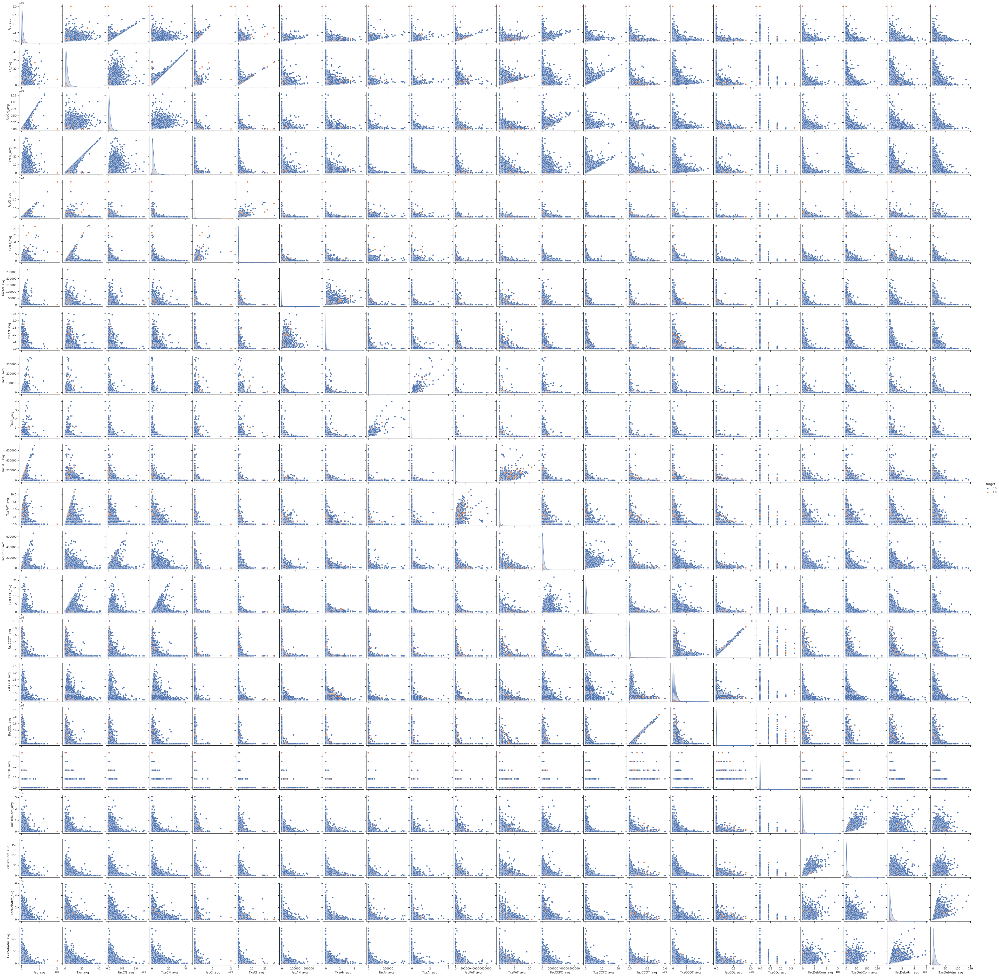

In [5]:
columnas_fac_txs = [col for col in monopoly.columns if col.startswith('Fac') or col.startswith('Txs')]

sns.set(style="ticks")
sns.pairplot(monopoly.to_pandas(), hue='target', vars=columnas_fac_txs)
plt.show()

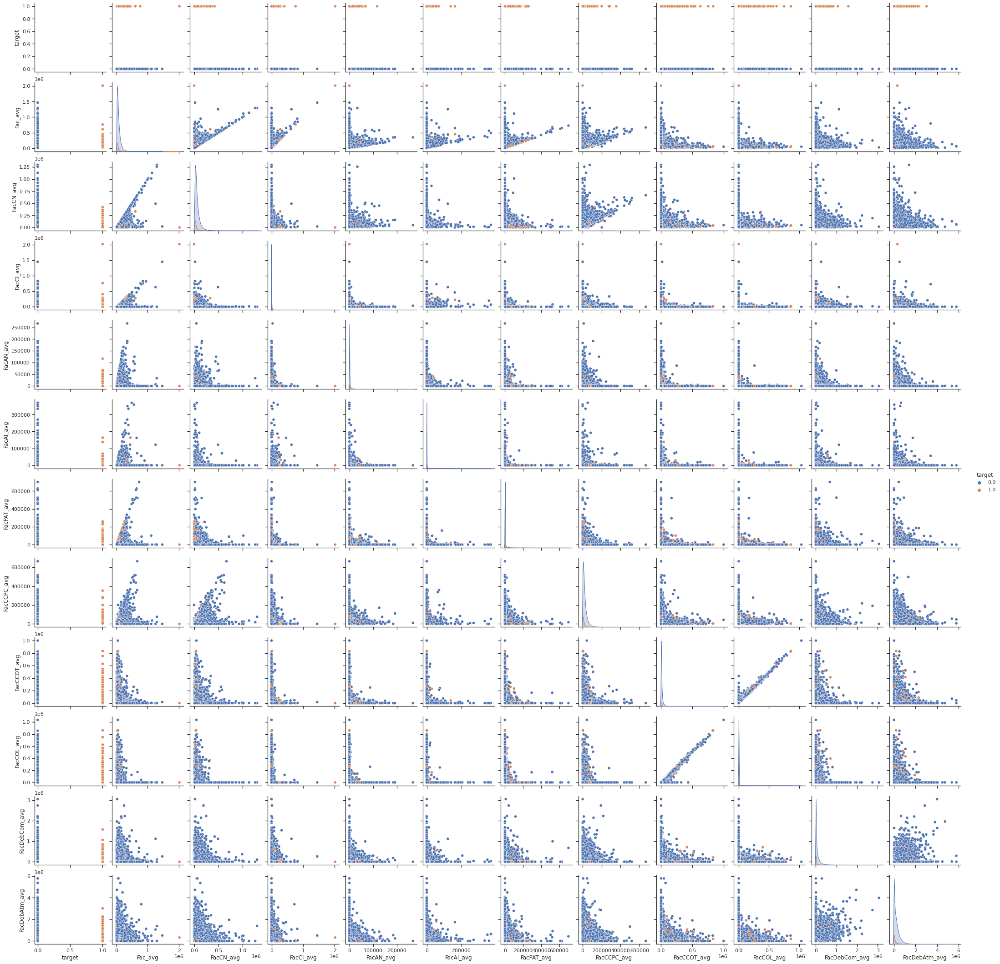

In [28]:

columnas_fac = [col for col in monopoly.columns if col.startswith('Fac') or col == 'target']
facturaciones = monopoly[columnas_fac]

sns.set(style="ticks")
sns.pairplot(monopoly.to_pandas(), hue='target', vars=columnas_fac)
plt.show()

Fac_T12: Monto facturado por el cliente en TC en el mes X
*   FacAI_T12: Monto facturado en avances internacionales por el cliente en TC en el mes X
*   FacAN_T12: Monto facturado en avances nacionales por el cliente en TC en el mes X
*   FacCCOT_T12: Monto facturado en compras en cuotas con tasa por el cliente en TC en el mes X
*   FacCCPC_T12: Monto facturado en compras en cuotas precio contado por el cliente en TC en el mes X
*   FacCI_T12: Monto facturado en compras internacionales por el cliente en TC en el mes X
*   FacCN_T12: Monto facturado en compras nacionales por el cliente en TC en el mes X
*   FacCOL_T12: Monto facturado en avances en cuotas por el cliente en TC en el mes X
*   FacDebAtm_T12: Monto facturado en avances por el cliente en TD en el mes X
*   FacDebCom_T12: Monto facturado en compras por el cliente en TD en el mes X
*   FacPAT_T12: Monto facturado en PAT por el cliente en TC en el mes X

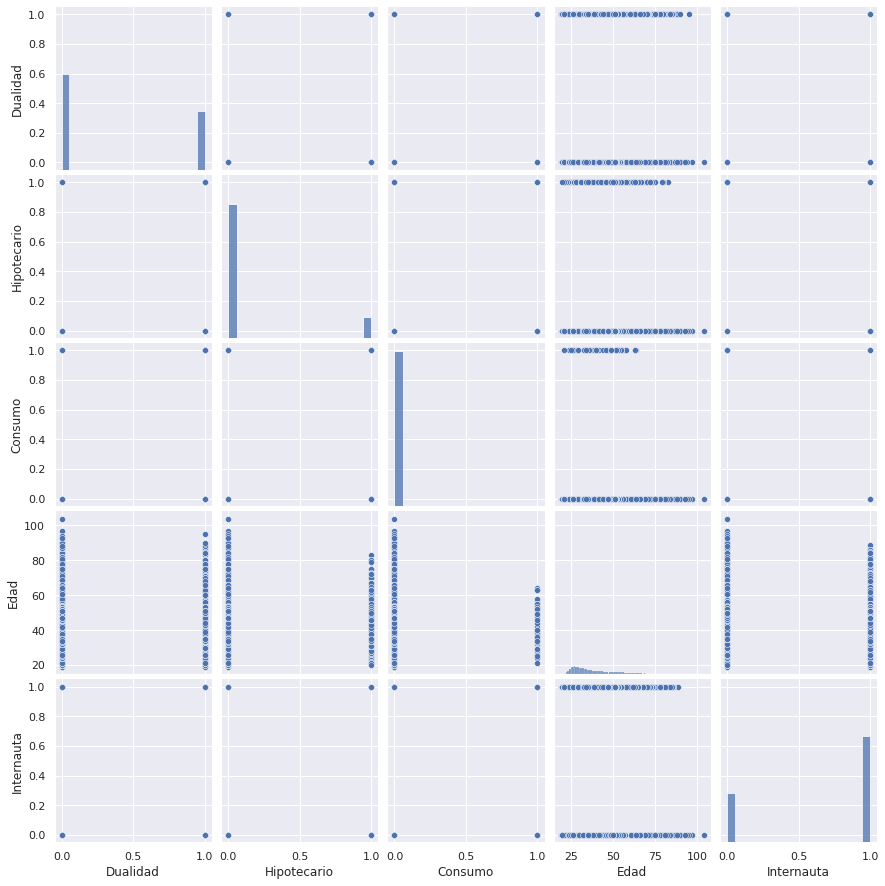

In [7]:
# Pair-plot
sns.set()
sns.pairplot(data=reduced_df.to_pandas(), vars=reduced_df.columns)
plt.show()

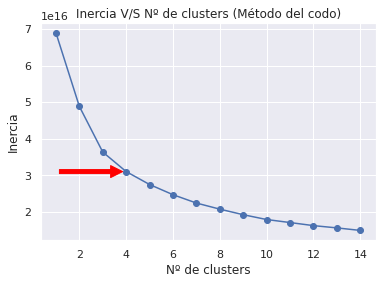

In [6]:
from kneed import KneeLocator

# Calcular la inercia para diferentes números de clusters
inercia = []
for i in range(1, 15):  # Rango de clusters
    modelo = KMeans(n_clusters=i, random_state=0)
    modelo.fit(red1)
    inercia.append(modelo.inertia_)

# Utilizar la biblioteca kneed para encontrar el "codo" de forma automática
kl = KneeLocator(range(1, 15), inercia, curve='convex', direction='decreasing')
codo_idx = kl.elbow

# Graficar la inercia
plt.plot(range(1, 15), inercia, marker='o')
plt.title('Inercia V/S Nº de clusters (Método del codo)')
plt.xlabel('Nº de clusters')
plt.ylabel('Inercia')

# Añadir ubicacion del codo
plt.annotate('', xy=(codo_idx, inercia[codo_idx-1]),
             xytext=(codo_idx - 3, inercia[codo_idx-1] + 500),
             arrowprops=dict(facecolor='red', edgecolor='red', shrink=0.05))

plt.show()

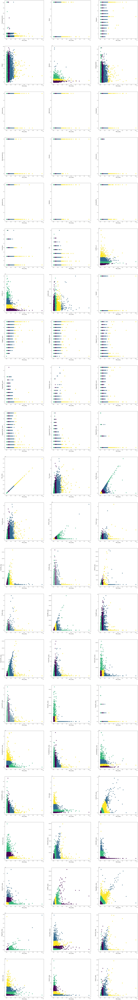

In [44]:
Kmodel = KMeans(n_clusters=4, random_state=321)
fig, ax = plt.subplots(22, 3, figsize=(11,220)) # figura con 3 graficos de ancho y 3 de alto
row = 0
col = 0
for colum in monopoly.columns:
    X = red1.to_pandas()[['Fac_avg',colum]].values
    Y_hat=Kmodel.fit_predict(X)

    # Visualiza los clusters
    plt.gcf().subplots_adjust(bottom=-0.2, left=-2)
    ax[row,col].scatter(X[:, 0], X[:, 1], c=Y_hat, cmap='viridis', s=100)
    ax[row,col].set_xlabel('Fac_avg', fontsize=20)
    ax[row,col].set_ylabel(colum, fontsize=20)

    col += 1
    if col > 2:
        row += 1
        col = 0

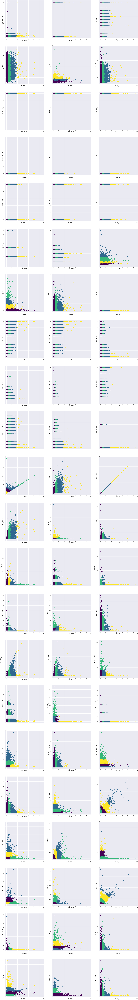

In [25]:
Kmodel = KMeans(n_clusters=4, random_state=321)
fig, ax = plt.subplots(22, 3, figsize=(11,220)) # figura con 3 graficos de ancho y 3 de alto
row = 0
col = 0
for colum in monopoly.columns:
    X = red1.to_pandas()[['FacCN_avg',colum]].values
    Y_hat=Kmodel.fit_predict(X)

    # Visualiza los clusters
    plt.gcf().subplots_adjust(bottom=-0.2, left=-2)
    ax[row,col].scatter(X[:, 0], X[:, 1], c=Y_hat, cmap='viridis', s=100)
    ax[row,col].set_xlabel('FacCN_avg', fontsize=20)
    ax[row,col].set_ylabel(colum, fontsize=20)

    col += 1
    if col > 2:
        row += 1
        col = 0

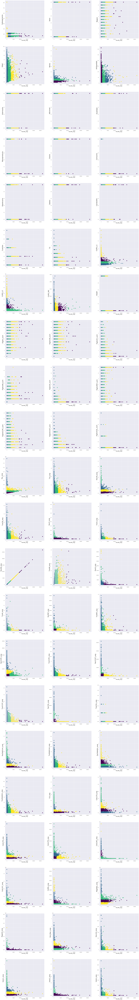

In [26]:

Kmodel = KMeans(n_clusters=4, random_state=321)
fig, ax = plt.subplots(22, 3, figsize=(11,220)) # figura con 3 graficos de ancho y 3 de alto
row = 0
col = 0
for colum in monopoly.columns:
    X = red1.to_pandas()[['FacAN_avg',colum]].values
    Y_hat=Kmodel.fit_predict(X)

    # Visualiza los clusters
    plt.gcf().subplots_adjust(bottom=-0.2, left=-2)
    ax[row,col].scatter(X[:, 0], X[:, 1], c=Y_hat, cmap='viridis', s=100)
    ax[row,col].set_xlabel('FacAN_avg', fontsize=20)
    ax[row,col].set_ylabel(colum, fontsize=25)

    col += 1
    if col > 2:
        row += 1
        col = 0
    


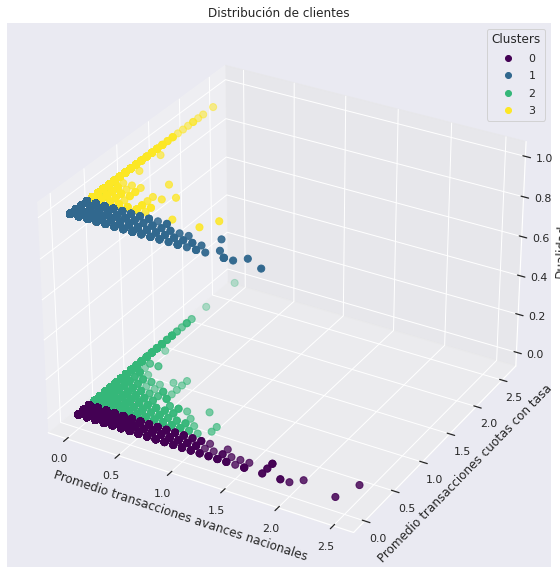

In [64]:
Kmodel = KMeans(n_clusters=4, random_state=321)
X = monopoly[['TxsAN_avg', 'TxsCCOT_avg', 'Dualidad']].values
Y_hat=Kmodel.fit_predict(X.to_pandas())

# Create a 3D scatter plot
fig = plt.figure(figsize=(11, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot points colored by cluster assignment
scatter = ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=Y_hat, cmap='viridis', s=50)

# Set labels for the axes
ax.set_xlabel('Promedio transacciones avances nacionales')
ax.set_ylabel('Promedio transacciones cuotas con tasa')
ax.set_zlabel('Dualidad')

# Set a title for the plot
ax.set_title('Distribución de clientes')

# Add a colorbar to show cluster assignments
plt.legend(*scatter.legend_elements(), title="Clusters")

plt.show()

*   TxsAN_T12: Numero de transacciones en avances nacionales realizados por el cliente en TC en el mes X
*   TxsCCOT_T12: Numero de transacciones en compras en cuotas con tasa realizados por el cliente en TC en el mes X
Se distingen 4 clusters, los clientes con pocas transacciones en cuotas con tasa y pocas transacciones en avances nacionales que tiene dos o más TC, los con pocas transacciones y una tarjeta y los con 

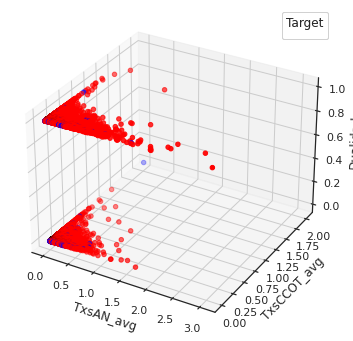

In [43]:
# Crear un gráfico de dispersión 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
df=monopoly.to_pandas()
# Scatter plot con hue='target'
scatter = ax.scatter(df['FacDebCom_avg'], df['Fac_avg'], df['Dualidad'], c=df['target'].map({0: 'red', 1: 'blue'}), label=df['target'])

# Etiquetas de los ejes
ax.set_xlabel('TxsAN_avg')
ax.set_ylabel('TxsCCOT_avg')
ax.set_zlabel('Dualidad')

# Leyenda
legend1 = ax.legend(*scatter.legend_elements(), title='Target')
ax.add_artist(legend1)

# Mostrar el gráfico
plt.show()